In [1]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, filters, util, io
from skimage.morphology import disk

from skimage.transform import resize
import cv2

In [2]:
calle = cv2.imread('imagenes\cebra.jpg', cv2.IMREAD_COLOR)
cactus = cv2.imread('imagenes\cactus.jpg', cv2.IMREAD_COLOR)
manzanas = cv2.imread('imagenes\manzanas.jpeg', cv2.IMREAD_COLOR)

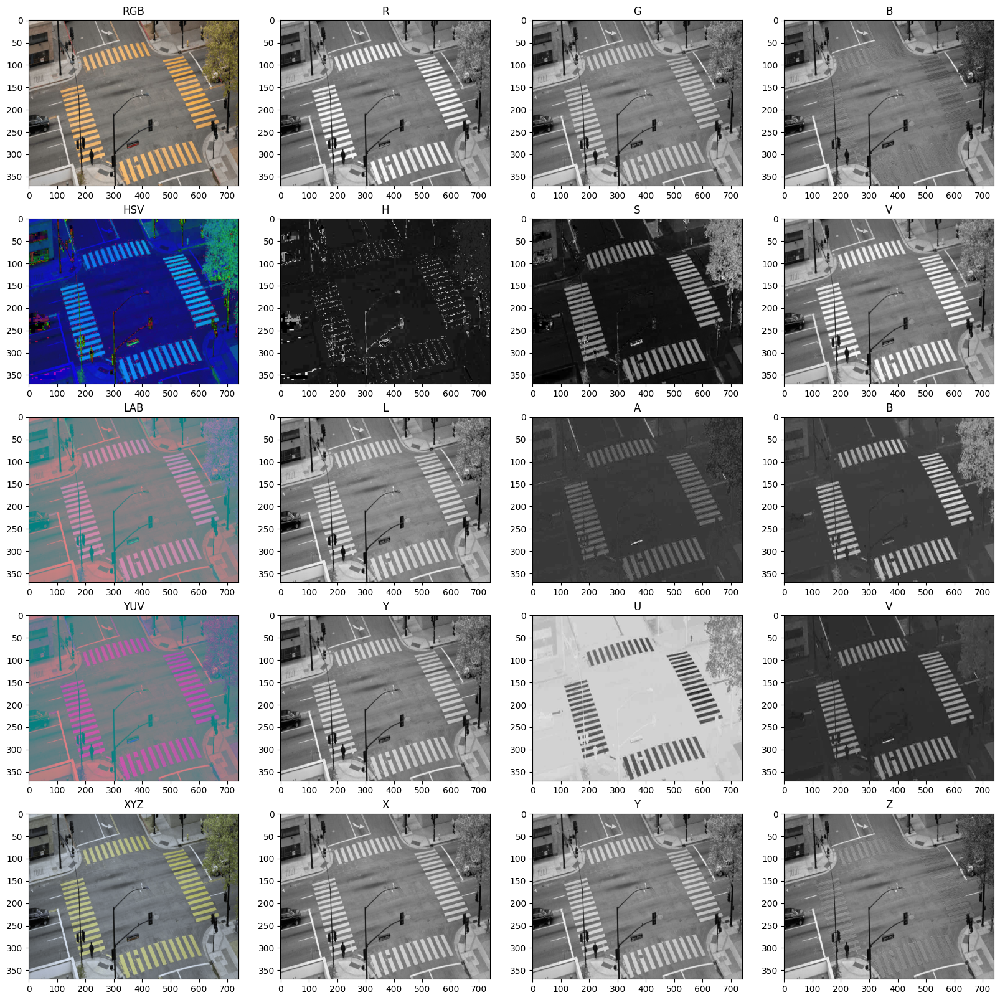

In [3]:
calle_rgb = cv2.cvtColor(calle, cv2.COLOR_BGR2RGB)
calle_hsv = cv2.cvtColor(calle, cv2.COLOR_BGR2HSV)
calle_lab = cv2.cvtColor(calle, cv2.COLOR_BGR2LAB)
calle_yuv = cv2.cvtColor(calle, cv2.COLOR_BGR2YUV)
calle_xyz = cv2.cvtColor(calle, cv2.COLOR_BGR2XYZ)

imagenes = [calle_rgb, calle_hsv, calle_lab, calle_yuv, calle_xyz]
espacios = ['RGB', 'HSV', 'LAB', 'YUV', 'XYZ']

filas = len(imagenes)
columnas = 4

fig, axs = plt.subplots(filas, columnas, figsize=(20,20))
ax = axs.ravel()

contador = 0
for imagen, espacio in zip(imagenes, espacios):
    ax[contador].set_title(espacio)
    ax[contador].imshow(imagen, aspect='auto')
    contador += 1
    for canal in range(3):
        ax[contador].set_title(espacio[canal])
        ax[contador].imshow(imagen[:,:,canal], cmap='gray', aspect='auto')
        contador += 1

plt.show()

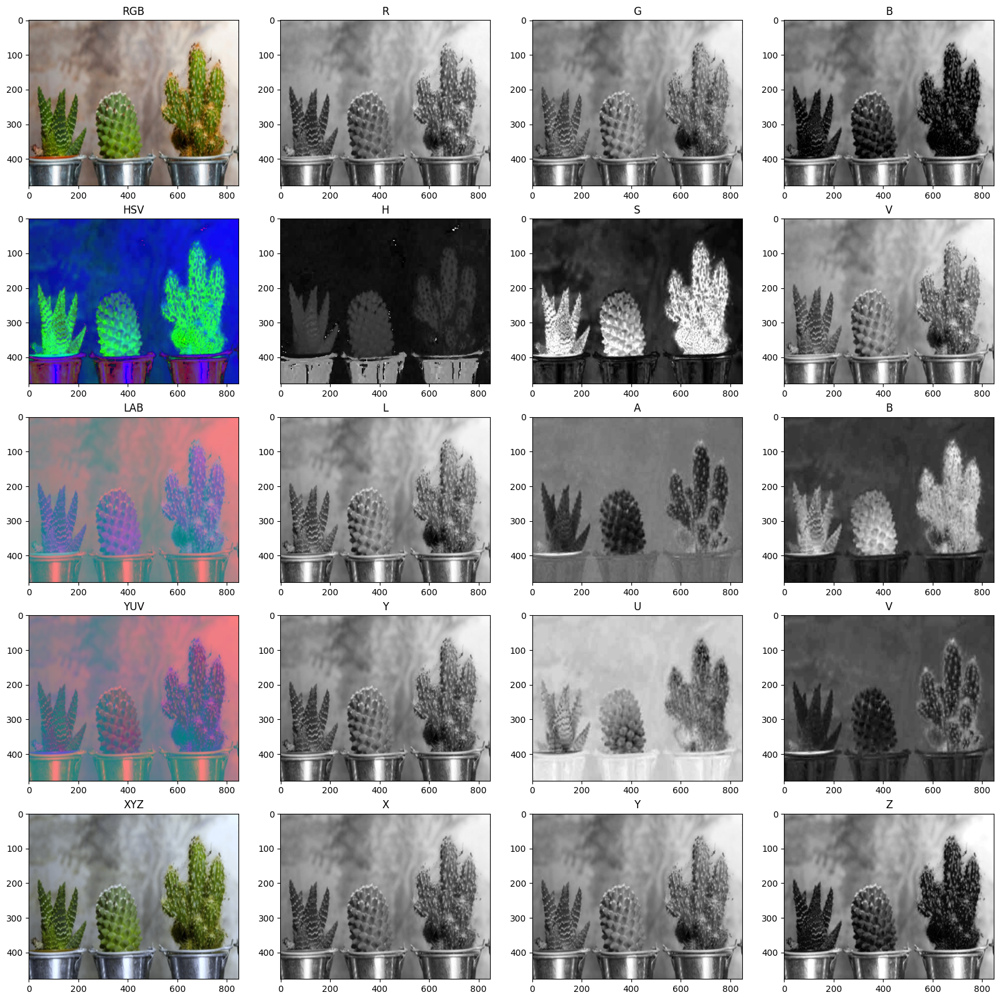

In [4]:
cactus_rgb = cv2.cvtColor(cactus, cv2.COLOR_BGR2RGB)
cactus_hsv = cv2.cvtColor(cactus, cv2.COLOR_BGR2HSV)
cactus_lab = cv2.cvtColor(cactus, cv2.COLOR_BGR2LAB)
cactus_yuv = cv2.cvtColor(cactus, cv2.COLOR_BGR2YUV)
cactus_xyz = cv2.cvtColor(cactus, cv2.COLOR_BGR2XYZ)

imagenes = [cactus_rgb, cactus_hsv, cactus_lab, cactus_yuv, cactus_xyz]
espacios = ['RGB', 'HSV', 'LAB', 'YUV', 'XYZ']

filas = len(imagenes)
columnas = 4

fig, axs = plt.subplots(filas, columnas, figsize=(20,20))
ax = axs.ravel()

contador = 0
for imagen, espacio in zip(imagenes, espacios):
    ax[contador].set_title(espacio)
    ax[contador].imshow(imagen, aspect='auto')
    contador += 1
    for canal in range(3):
        ax[contador].set_title(espacio[canal])
        ax[contador].imshow(imagen[:,:,canal], cmap='gray', aspect='auto')
        contador += 1

plt.show()

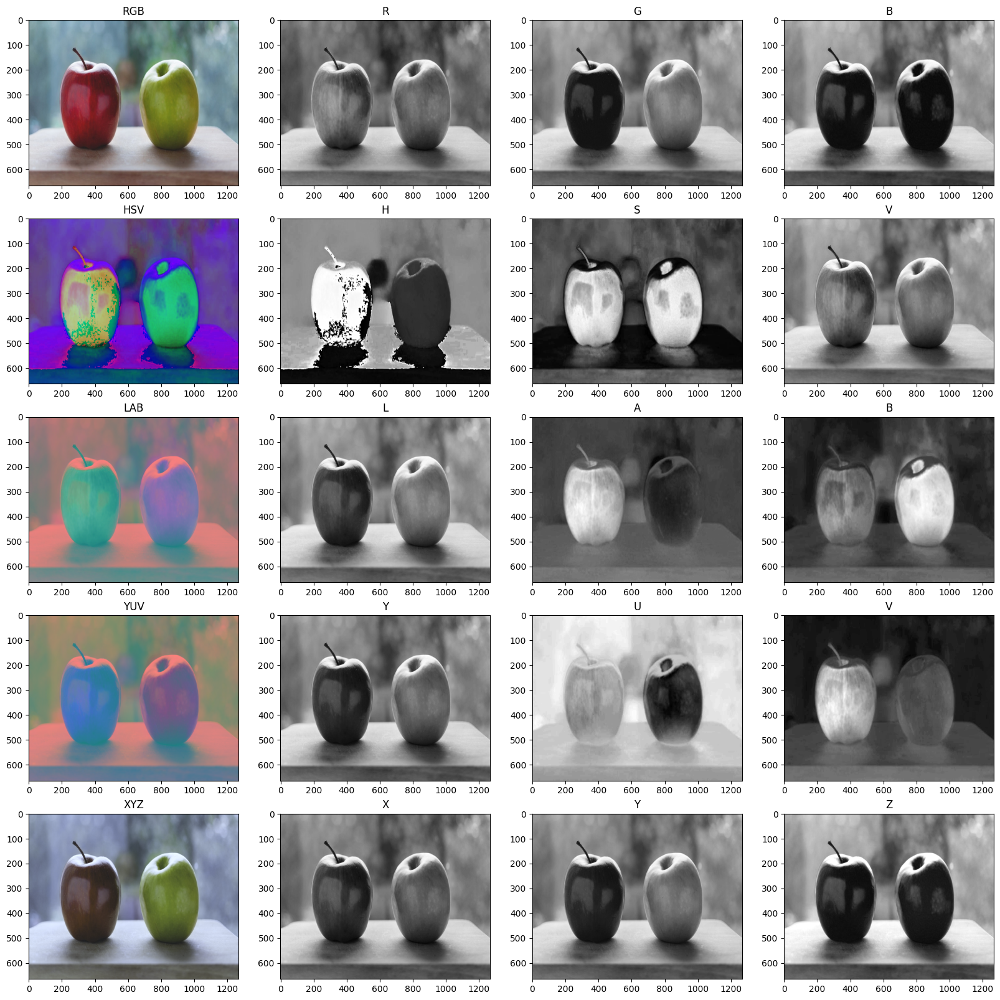

In [5]:
manzanas_rgb = cv2.cvtColor(manzanas, cv2.COLOR_BGR2RGB)
manzanas_hsv = cv2.cvtColor(manzanas, cv2.COLOR_BGR2HSV)
manzanas_lab = cv2.cvtColor(manzanas, cv2.COLOR_BGR2LAB)
manzanas_yuv = cv2.cvtColor(manzanas, cv2.COLOR_BGR2YUV)
manzanas_xyz = cv2.cvtColor(manzanas, cv2.COLOR_BGR2XYZ)

imagenes = [manzanas_rgb, manzanas_hsv, manzanas_lab, manzanas_yuv, manzanas_xyz]
espacios = ['RGB', 'HSV', 'LAB', 'YUV', 'XYZ']

filas = len(imagenes)
columnas = 4

fig, axs = plt.subplots(filas, columnas, figsize=(20,20))
ax = axs.ravel()

contador = 0
for imagen, espacio in zip(imagenes, espacios):
    ax[contador].set_title(espacio)
    ax[contador].imshow(imagen, aspect='auto')
    contador += 1
    for canal in range(3):
        ax[contador].set_title(espacio[canal])
        ax[contador].imshow(imagen[:,:,canal], cmap='gray', aspect='auto')
        contador += 1

plt.show()

## Histogramas

In [6]:
#Leer las imágenes 1 a la 4 en RGB
img1 = io.imread('imagenes/low_light.png')
img2 = io.imread('imagenes/hi_light.png')
img3 = io.imread('imagenes/low_contrast.png')
img4 = io.imread('imagenes/hi_contrast.png')

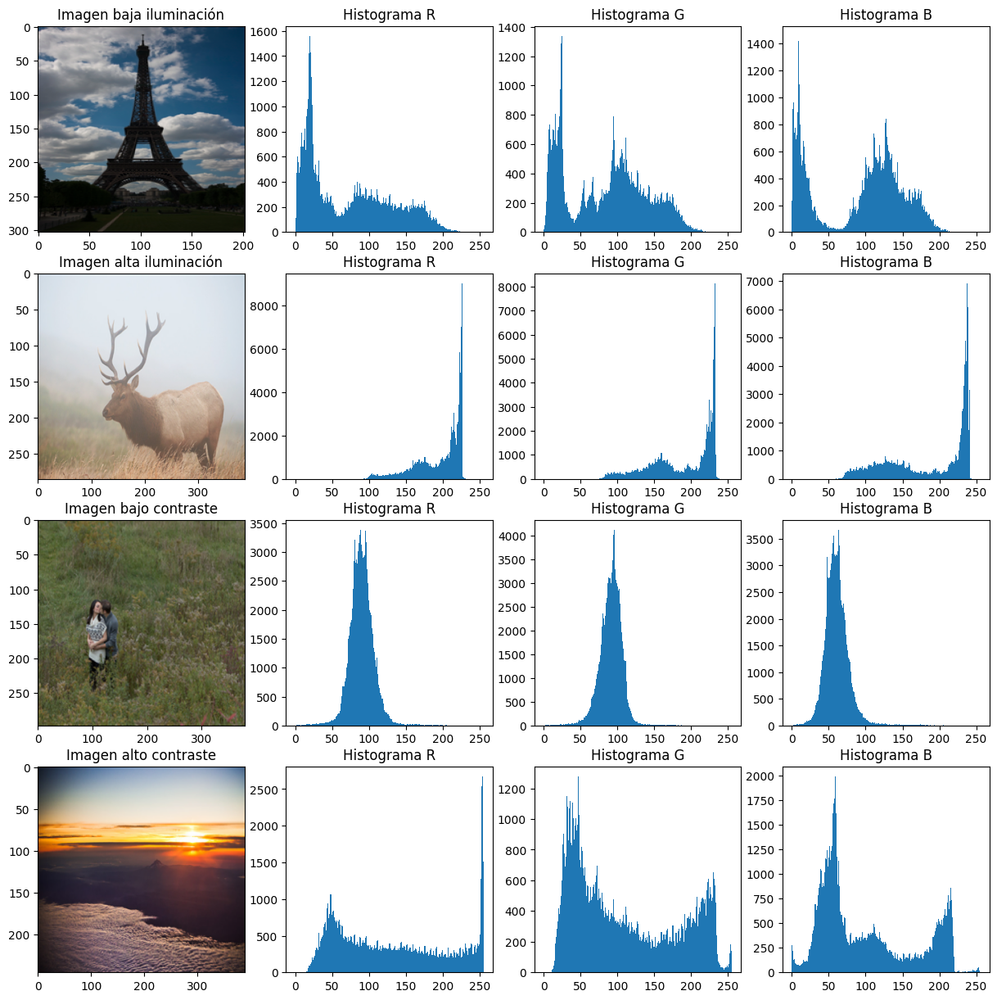

In [7]:
imagenes_png = [img1, img2, img3, img4]
labels = ['Imagen baja iluminación', 'Imagen alta iluminación', 'Imagen bajo contraste', 'Imagen alto contraste']

filas = len(imagenes_png)
columnas = 4

fig, axs = plt.subplots(filas, columnas, figsize=(15, 15))
ax = axs.ravel()

contador = 0
for imagen, label in zip(imagenes_png, labels):
    ax[contador].set_title(label)
    ax[contador].imshow(imagen, aspect='auto')
    contador += 1
    for i in range(3):
        ax[contador].set_title(f'Histograma {"RGB"[i]}')
        ax[contador].hist(imagen[:,:,i].ravel(), bins=256, range=(0.0, 255.0))
        contador += 1

plt.show()

In [8]:
I1 = io.imread('imagenes/example_1.png')
I2 = io.imread('imagenes/example_2.png')
I3 = io.imread('imagenes/example_3.png')
I4 = io.imread('imagenes/example_4.png')

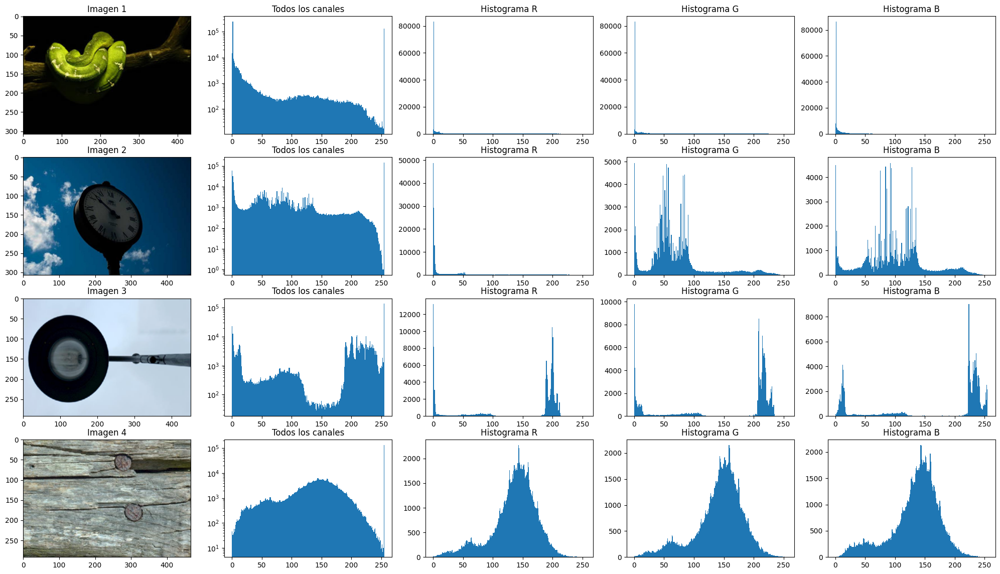

In [9]:
imagenes_png = [I1, I2, I3, I4]
labels = ['Imagen 1', 'Imagen 2', 'Imagen 3', 'Imagen 4']

filas = len(imagenes_png)
columnas = 5

fig, axs = plt.subplots(filas, columnas, figsize=(25, 14))
ax = axs.ravel()

contador = 0
for imagen, label in zip(imagenes_png, labels):
    ax[contador].set_title(label)
    ax[contador].imshow(imagen, aspect='auto')
    contador += 1
    ax[contador].set_title('Todos los canales')
    ax[contador].hist(imagen.ravel(), bins=255, range=(0.0, 255.0), log=True)
    contador += 1
    for i in range(3):
        ax[contador].set_title(f'Histograma {"RGB"[i]}')
        ax[contador].hist(imagen[:,:,i].ravel(), bins=256, range=(0.0, 255.0))
        contador += 1

plt.show()

## cv2.add()

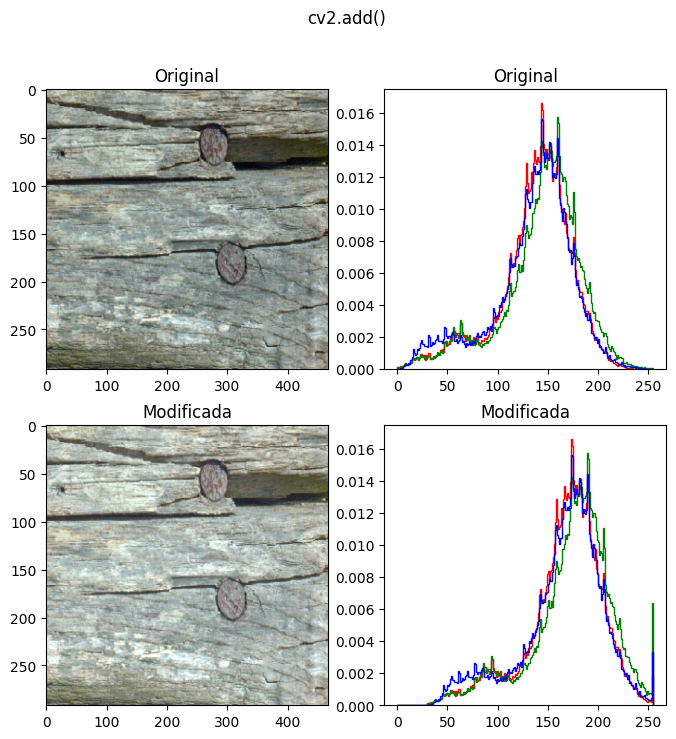

In [10]:
img = cv2.cvtColor(cv2.imread('imagenes/example_4.png'), cv2.COLOR_BGR2RGB)
img_add = np.zeros(img.shape, np.uint8)

r, g, b = 30, 30, 30

img_add[:,:,0] = cv2.add(img[:,:,0], r)
img_add[:,:,1] = cv2.add(img[:,:,1], g)
img_add[:,:,2] = cv2.add(img[:,:,2], b)

imagenes_png = [img, img_add]
labels = ['Original', 'Modificada']

fig, axs = plt.subplots(2,2, figsize=(8, 8))
colors = ('r','g','b')

ax = axs.ravel()

fig.suptitle('cv2.add()')

contador = 0
for imagen, label in zip(imagenes_png, labels):
    ax[contador].set_title(label)
    ax[contador].imshow(imagen, aspect='auto')
    contador += 1
    for i, color in enumerate(colors):
        ax[contador].set_title(label)
        ax[contador].hist(imagen[:,:,i].ravel() ,histtype='step', bins=255, 
                            range=(0.0, 255.0),density=True, color=colors[i])
    contador += 1

plt.show()

## cv2.subtract()

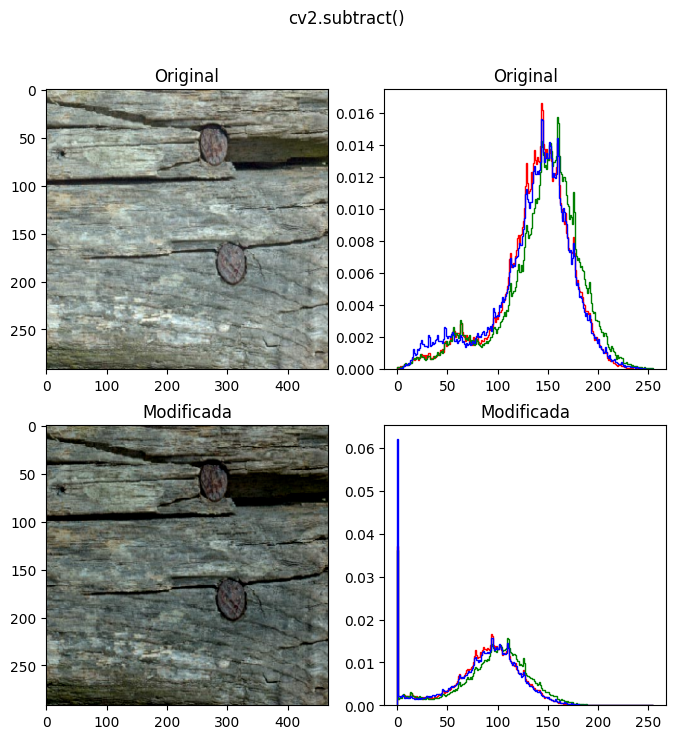

In [11]:
r, g, b = 50, 50, 50

img_add[:,:,0] = cv2.subtract(img[:,:,0], r)
img_add[:,:,1] = cv2.subtract(img[:,:,1], g)
img_add[:,:,2] = cv2.subtract(img[:,:,2], b)

imagenes_png = [img, img_add]
labels = ['Original', 'Modificada']

fig, axs = plt.subplots(2,2, figsize=(8, 8))
colors = ('r','g','b')

ax = axs.ravel()

fig.suptitle('cv2.subtract()')

contador = 0
for imagen, label in zip(imagenes_png, labels):
    ax[contador].set_title(label)
    ax[contador].imshow(imagen, aspect='auto')
    contador += 1
    for i in range(3):
        ax[contador].set_title(label)
        ax[contador].hist(imagen[:,:,i].ravel() ,histtype='step', bins=255, 
                            range=(0.0, 255.0),density=True, color=colors[i])
    contador += 1

plt.show()

## Negativo

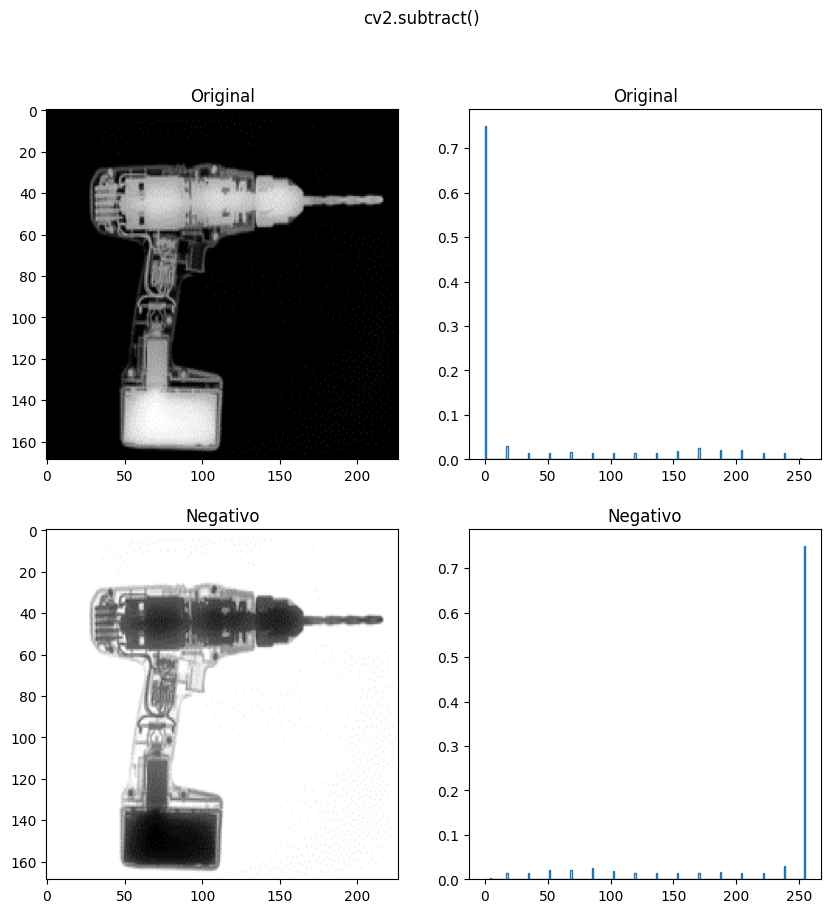

In [12]:
taladro = cv2.imread('imagenes/taladro.png', cv2.IMREAD_GRAYSCALE)

taladro_negativo = cv2.subtract(255, taladro)

imagenes_png = [taladro, taladro_negativo]
labels = ['Original', 'Negativo']

fig, axs = plt.subplots(2,2, figsize=(10, 10))

ax = axs.ravel()

fig.suptitle('cv2.subtract()')

contador = 0
for imagen, label in zip(imagenes_png, labels):
    ax[contador].set_title(label)
    ax[contador].imshow(imagen, aspect='auto', cmap='gray')
    contador += 1
    ax[contador].set_title(label)
    ax[contador].hist(imagen.ravel() ,histtype='step', bins=255, 
                            range=(0.0, 255.0),density=True)
    contador += 1

plt.show()

## cv2.multiply()

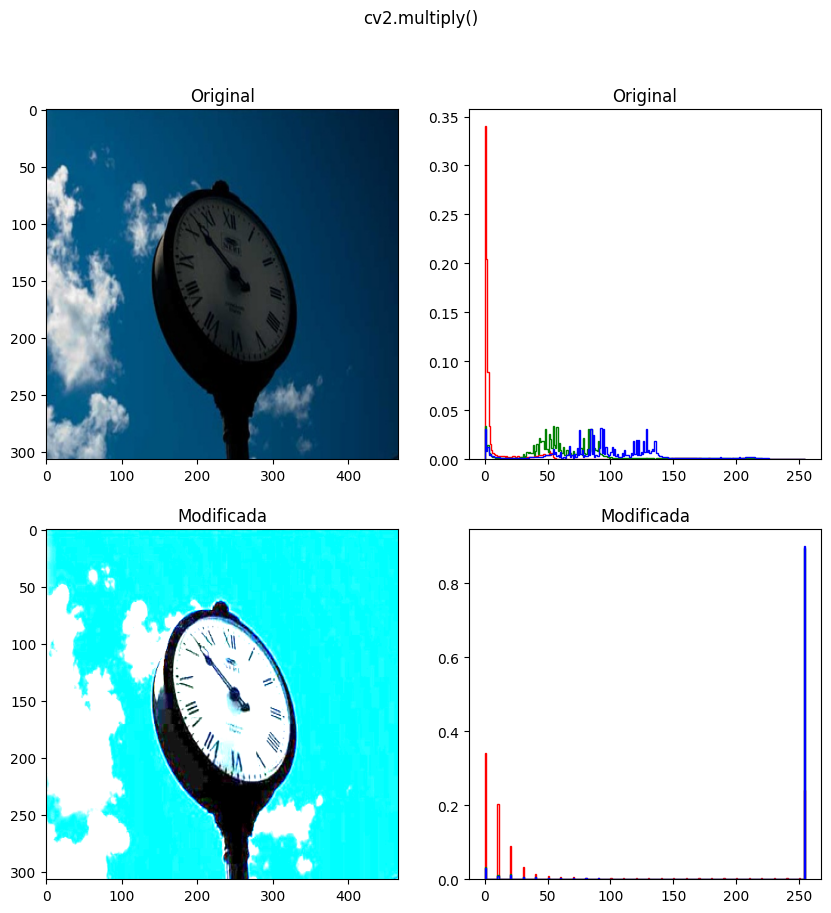

In [13]:
img = cv2.cvtColor(cv2.imread('imagenes/example_2.png'), cv2.COLOR_BGR2RGB)

img_mult = np.zeros(img.shape, np.uint8)

q, w, e = 10, 10, 10
img_mult[:,:,0] = cv2.multiply(img[:,:,0], q)
img_mult[:,:,1] = cv2.multiply(img[:,:,1], w)
img_mult[:,:,2] = cv2.multiply(img[:,:,2], e)

imagenes_png = [img, img_mult]
labels = ['Original', 'Modificada']

fig, axs = plt.subplots(2,2, figsize=(10, 10))
colors = ('r','g','b')

ax = axs.ravel()

fig.suptitle('cv2.multiply()')

contador = 0
for imagen, label in zip(imagenes_png, labels):
    ax[contador].set_title(label)
    ax[contador].imshow(imagen,aspect='auto')
    contador += 1
    for i in range(3):
        ax[contador].set_title(label)
        ax[contador].hist(imagen[:,:,i].ravel() ,histtype='step', bins=255, 
                            range=(0.0, 255.0),density=True, color=colors[i])
    contador += 1

plt.show()

## Operación de división

La **división** es una operación que permite “encoger” el histograma de una imagen.

La división es multiplicar por un valor entre 0 y 1.

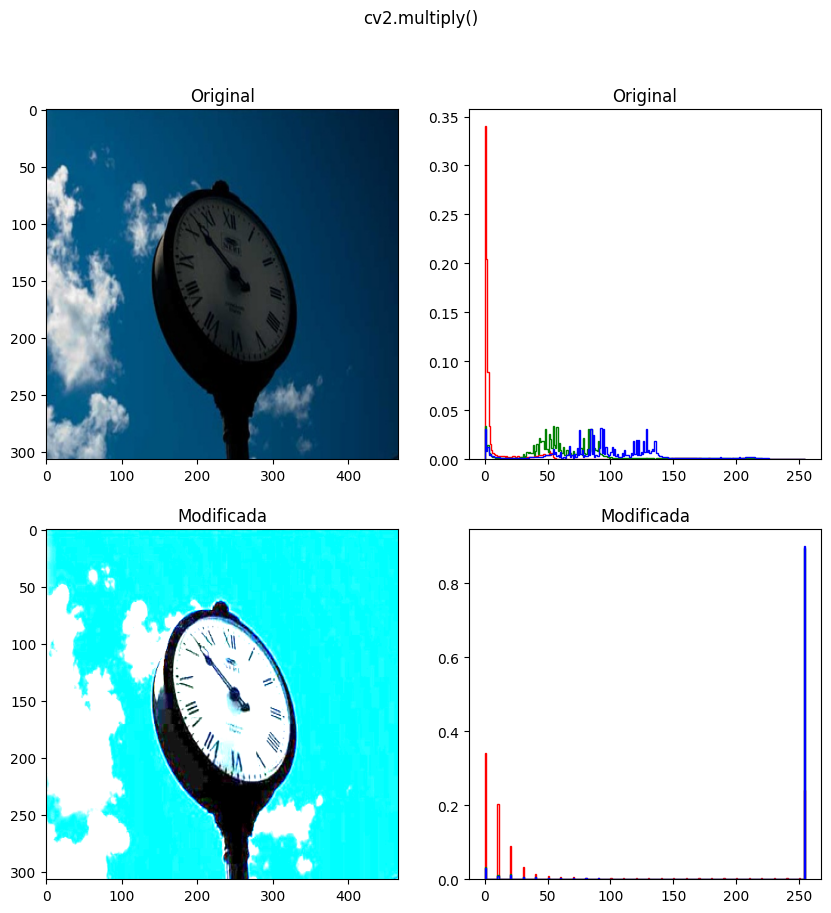

In [14]:
img = cv2.cvtColor(cv2.imread('imagenes/example_2.png'), cv2.COLOR_BGR2RGB)

img_div = np.zeros(img.shape, np.uint8)

q, w, e = 0.5, 0.5, 0.5
img_div[:,:,0] = cv2.multiply(img[:,:,0], q)
img_div[:,:,1] = cv2.multiply(img[:,:,1], w)
img_div[:,:,2] = cv2.multiply(img[:,:,2], e)

imagenes_png = [img, img_mult]
labels = ['Original', 'Modificada']

fig, axs = plt.subplots(2,2, figsize=(10, 10))
colors = ('r','g','b')

ax = axs.ravel()

fig.suptitle('cv2.multiply()')

contador = 0
for imagen, label in zip(imagenes_png, labels):
    ax[contador].set_title(label)
    ax[contador].imshow(imagen,aspect='auto')
    contador += 1
    for i in range(3):
        ax[contador].set_title(label)
        ax[contador].hist(imagen[:,:,i].ravel() ,histtype='step', bins=255, 
                            range=(0.0, 255.0),density=True, color=colors[i])
    contador += 1

plt.show()